
**Task1.Data Collection and Preprocessing (4 Marks):**

•Task: Select an appropriate dataset and perform data preprocessing,
including data cleaning, feature engineering, and scaling/normalization.
•Details: Explain the choices made during preprocessing and how they
impact the model. Use KizenML or other tools for AutoEDA if applicable.
•Marks: 4 Marks




##Importing Libreries

In [3]:
!pip install tpot

# Install sweetviz
!pip install sweetviz

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.4/87.4 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 37.9 MB/s eta 0:00:00
  Created wheel for stopit: filename=stopit-1.1.2-py3-none-any.whl size=11938 sha256=902b1c0619ad0cc9da2972362c3b84a272423cc143d8d95e9bd2524e70f0cca2
  Stored in directory: /root/.cache/pip/wheels/af/f9/87/bf5b3d565c2a007b4dae9d8142dccc85a9f164e517062dd519
Successfully built stopit
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2


In [41]:
# Importing necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import sweetviz as sv
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tpot import TPOTClassifier
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
warnings.filterwarnings('ignore')

# Data Preparation

In [2]:
#Load the wineequality-red.csv data
df1=pd.read_csv('winequality-red.csv',sep=";")
df1.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [3]:
#Load the wineequality-white.csv data
df2=pd.read_csv('winequality-white.csv',sep=";")
df2.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [4]:
# Check for missing values
print(df1.isnull().sum())

# Get basic statistics
print(df1.describe())

# Check for missing values
print(df2.isnull().sum())

# Get basic statistics
print(df2.describe())

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64
       fixed acidity  volatile acidity  citric acid  residual sugar  \
count    1599.000000       1599.000000  1599.000000     1599.000000   
mean        8.319637          0.527821     0.270976        2.538806   
std         1.741096          0.179060     0.194801        1.409928   
min         4.600000          0.120000     0.000000        0.900000   
25%         7.100000          0.390000     0.090000        1.900000   
50%         7.900000          0.520000     0.260000        2.200000   
75%         9.200000          0.640000     0.420000        2.600000   
max        15.900000          1.580000     1.000000       15.500000   

         chlorides  free sulfur dio

##Data Preprocessing

In [5]:
#concate two datasets
df=pd.concat([df1,df2],axis=1)
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,...,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,...,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,...,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,...,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,...,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,...,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [7]:
#printing mean,min,max of two dataset
print(df1['quality'].mean(),df2['quality'].mean(),df1['quality'].max(),df2['quality'].min(),df1['quality'].max(),df2['quality'].min())

5.87790935075541 5.6360225140712945 9 3 8.0 3.0


In [8]:
#printing count of each quality category of both dataset
df1['quality'].value_counts(),df2['quality'].value_counts()

(quality
 5    681
 6    638
 7    199
 4     53
 8     18
 3     10
 Name: count, dtype: int64,
 quality
 6    2198
 5    1457
 7     880
 8     175
 4     163
 3      20
 9       5
 Name: count, dtype: int64)

In [9]:
#grouping the red data w.r.t quality
d=df1.groupby('quality')

In [13]:
d1=df2.groupby('quality')
x1=d1.get_group(3).median()
y1=d1.get_group(9).median()
print(x1,y1)

fixed acidity             7.300000
volatile acidity          0.260000
citric acid               0.345000
residual sugar            4.600000
chlorides                 0.041000
free sulfur dioxide      33.500000
total sulfur dioxide    159.500000
density                   0.994425
pH                        3.215000
sulphates                 0.440000
alcohol                  10.450000
quality                   3.000000
dtype: float64 fixed acidity             7.1000
volatile acidity          0.2700
citric acid               0.3600
residual sugar            2.2000
chlorides                 0.0310
free sulfur dioxide      28.0000
total sulfur dioxide    119.0000
density                   0.9903
pH                        3.2800
sulphates                 0.4600
alcohol                  12.5000
quality                   9.0000
dtype: float64


In [14]:
df1['quality'].unique(),df2['quality'].unique()

array([6, 5, 7, 8, 4, 3, 9])

In [15]:
x=d.get_group(3)
m2=d.get_group(4)
m1=d.get_group(5)
m3=d.get_group(6)
m4=d.get_group(7)
x2=d.get_group(8)

In [16]:
mean1=list(
[x['quality'].median(),m2['quality'].median(),m1['quality'].median(),m3['quality'].median(),m4['quality'].median(),x2['quality'].median()])
mean1

[3.0, 4.0, 5.0, 6.0, 7.0, 8.0]

In [17]:
mean2=list(
[x['volatile acidity'].median(),m2['volatile acidity'].median(),m1['volatile acidity'].median(),m3['volatile acidity'].median(),m4['volatile acidity'].median(),x2['volatile acidity'].median()])
mean2

[0.845, 0.67, 0.58, 0.49, 0.37, 0.37]

In [18]:
mean3=list(
[x['quality'].median(),m2['quality'].median(),m1['quality'].median(),m3['quality'].median(),m4['quality'].median(),x2['quality'].median()])
mean3

[3.0, 4.0, 5.0, 6.0, 7.0, 8.0]

In [19]:
mean4=list(
[x['free sulfur dioxide'].median(),m2['free sulfur dioxide'].median(),m1['free sulfur dioxide'].median(),m3['free sulfur dioxide'].median(),m4['free sulfur dioxide'].median(),x2['free sulfur dioxide'].median()])
mean4

[6.0, 11.0, 15.0, 14.0, 11.0, 7.5]

##Data Visualization

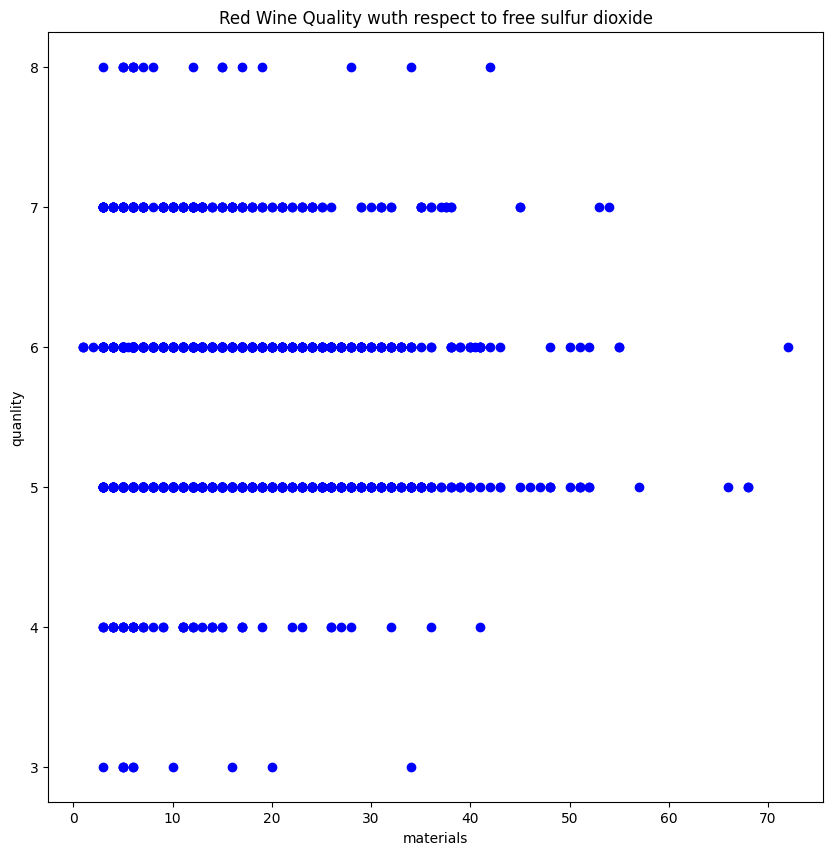

In [20]:

x=df1['free sulfur dioxide']
y=df1['quality']
fig=plt.figure(figsize=(10,10))
plt.scatter(x,y,color="blue")
plt.xlabel("materials")
plt.ylabel("quanlity")
plt.title("Red Wine Quality wuth respect to free sulfur dioxide")
plt.show()

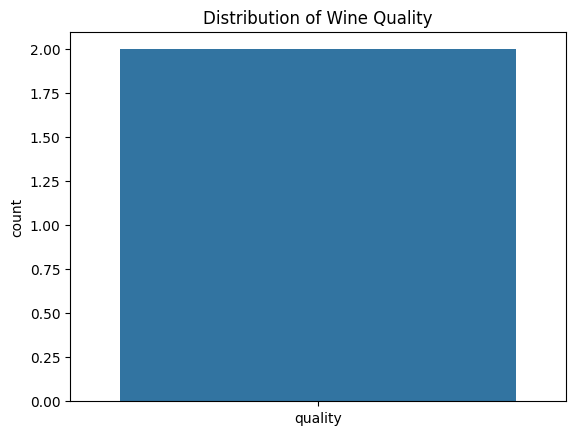

In [21]:

# Plot the distribution of wine quality
sns.countplot(x=list(df['quality']))
plt.title('Distribution of Wine Quality')
plt.show()

Text(0.5, 1.0, 'Quality of red wine with respect to the free sulfur dioxide')

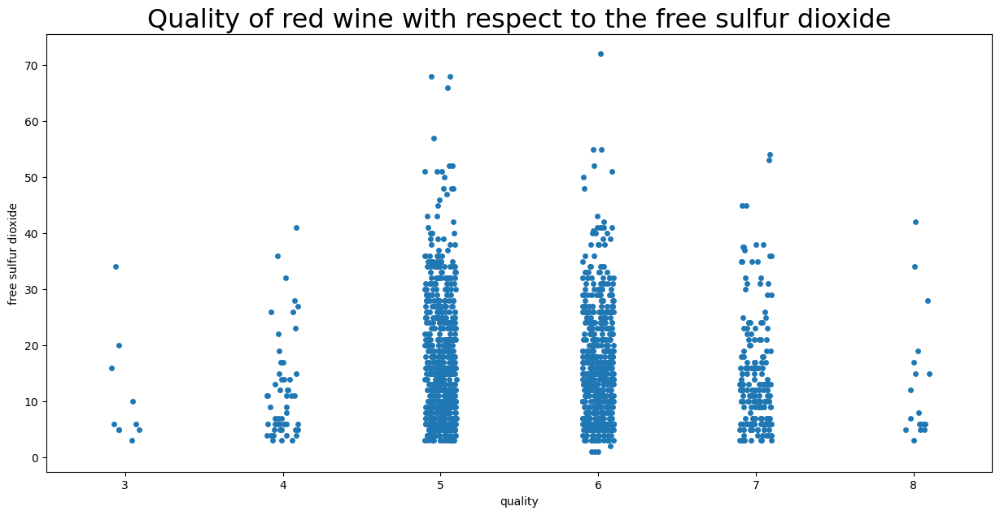

In [22]:
plt.figure(figsize=(15,7))
sns.stripplot(x=y,y=x, data=df1, jitter=True)
plt.title('Quality of red wine with respect to the free sulfur dioxide',fontsize=23)

Text(0.5, 1.0, 'Correlation graph of each faeture For Red Wine ')

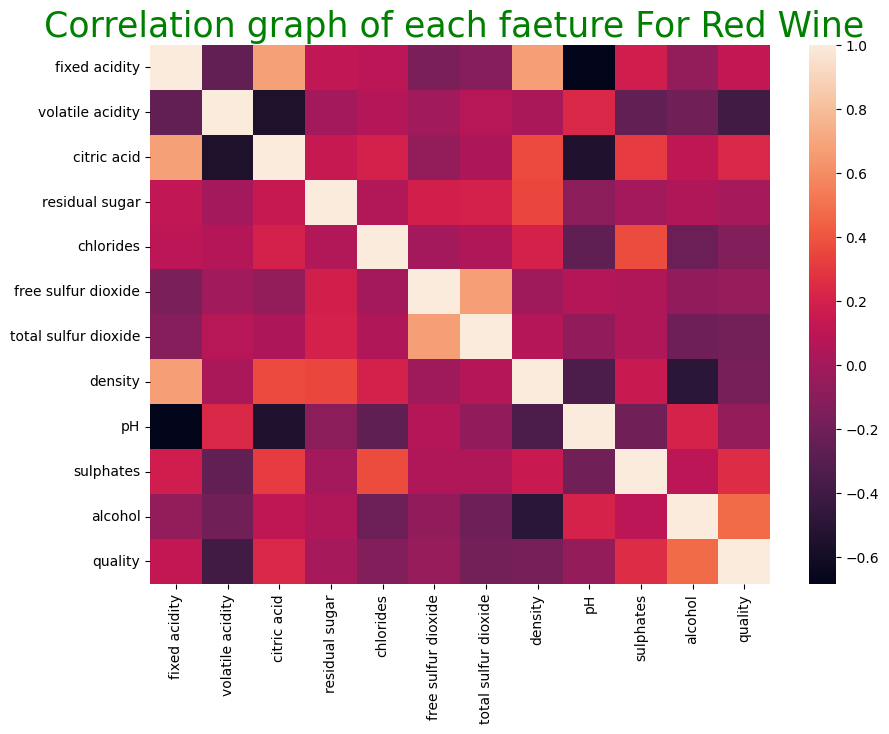

In [23]:
plt.figure(figsize=(10,7))
sns.heatmap(df1.corr())
plt.title('Correlation graph of each faeture For Red Wine ',fontsize=25,color="Green")

Text(0.5, 1.0, 'Correlation graph of each faeture For White Wine ')

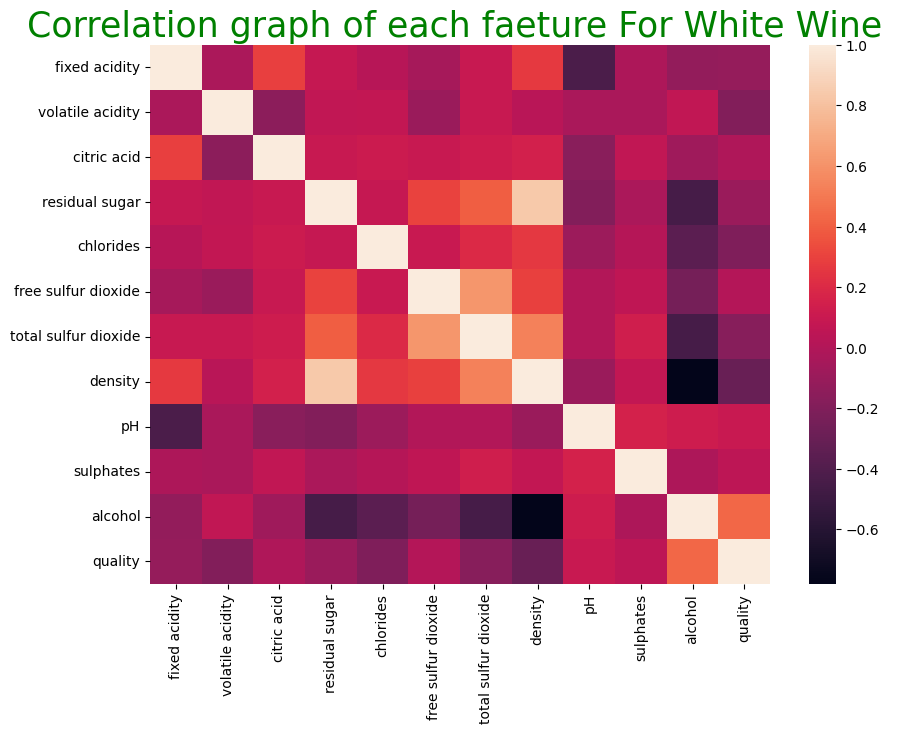

In [24]:
plt.figure(figsize=(10,7))
sns.heatmap(df2.corr())
plt.title('Correlation graph of each faeture For White Wine ',fontsize=25,color="Green")

Text(0.5, 1.0, 'Count Fixed acidity with respect to the quality of red wine')

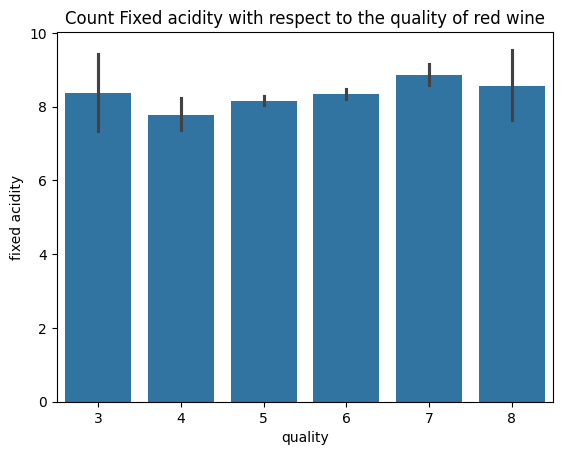

In [25]:
x=df1['fixed acidity']
sns.barplot(x=df1['quality'],y=x)
plt.title("Count Fixed acidity with respect to the quality of red wine")

<Axes: xlabel='fixed acidity', ylabel='quality'>

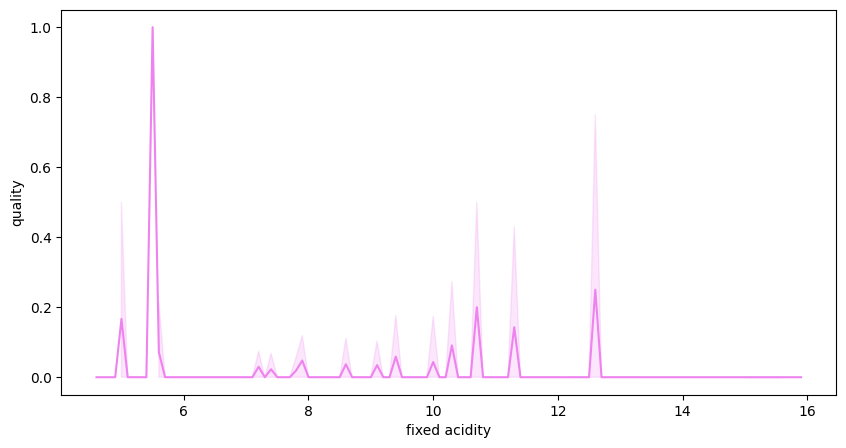

In [26]:

x=df1['fixed acidity']
y=df1['quality']==8
fig=plt.figure(figsize=(10,5))
sns.lineplot(x=x,y=y,color='violet')

Text(0.5, 1.0, 'Density of red wine for quality')

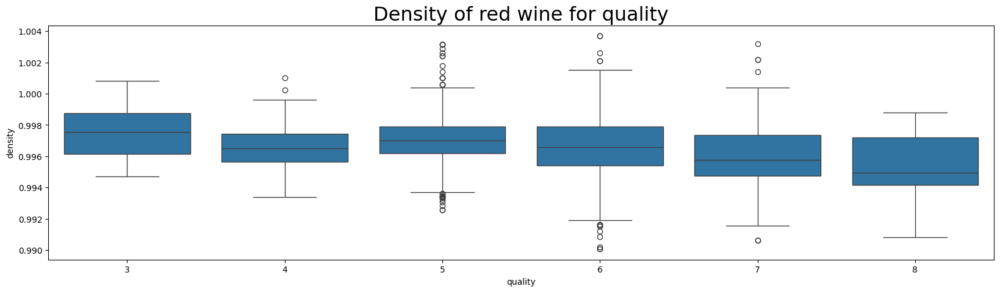

In [27]:
fig=plt.figure(figsize=(20,5))
sns.boxplot( x = "quality", y = "density",data = df1)
plt.title("Density of red wine for quality",fontsize=23)

Text(0.5, 1.0, 'Pairplot with respect to the Each columns')

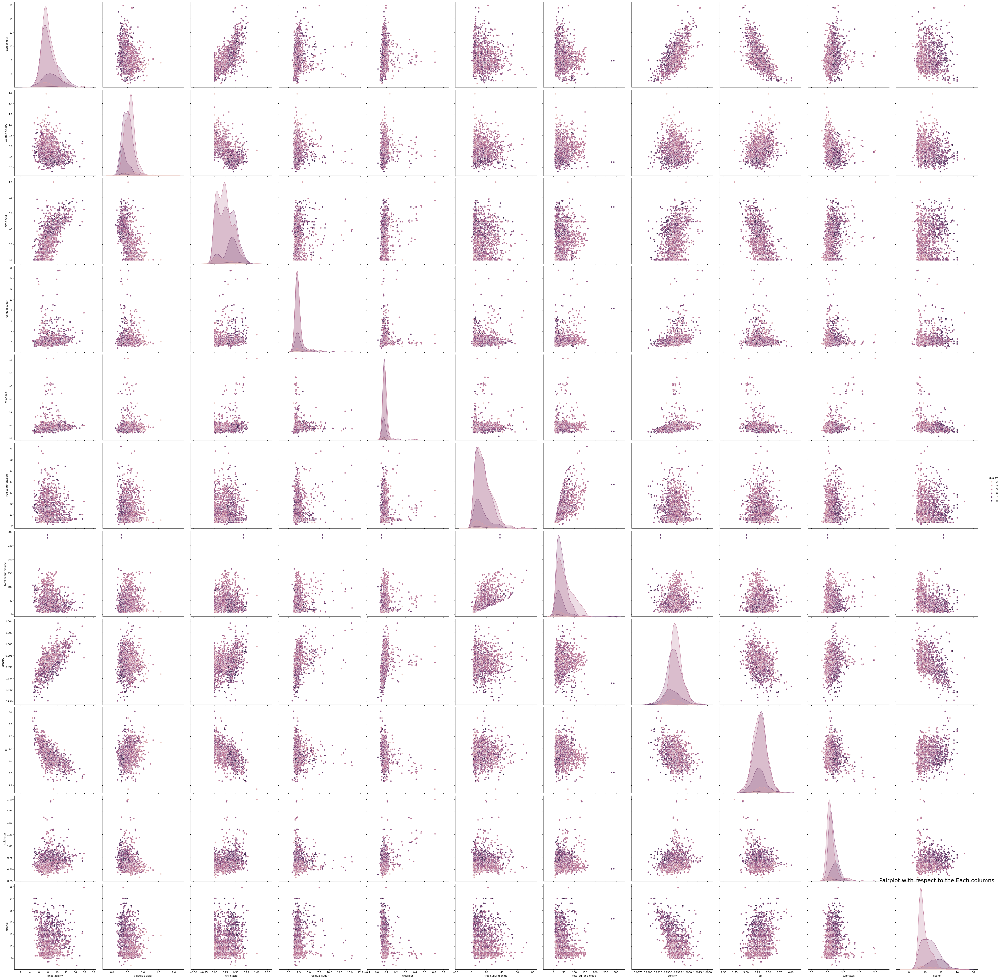

In [28]:
sns.pairplot(df1, hue='quality', size=5);
plt.title("Pairplot with respect to the Each columns",fontsize=22)

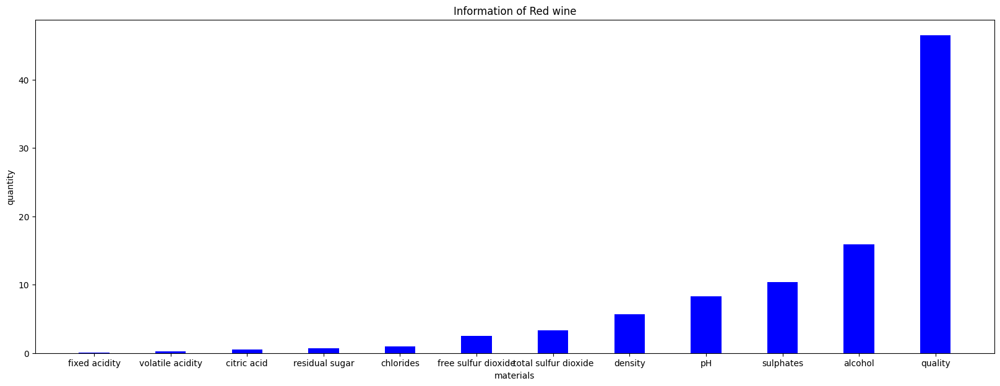

In [29]:

y=list(df1.columns)
x=list(mean)

fig=plt.figure(figsize=(20,7))
plt.bar(y,x,color="blue",width=0.4)
plt.xlabel("materials")
plt.ylabel("quantity")
plt.title("Information of Red wine")
plt.show()


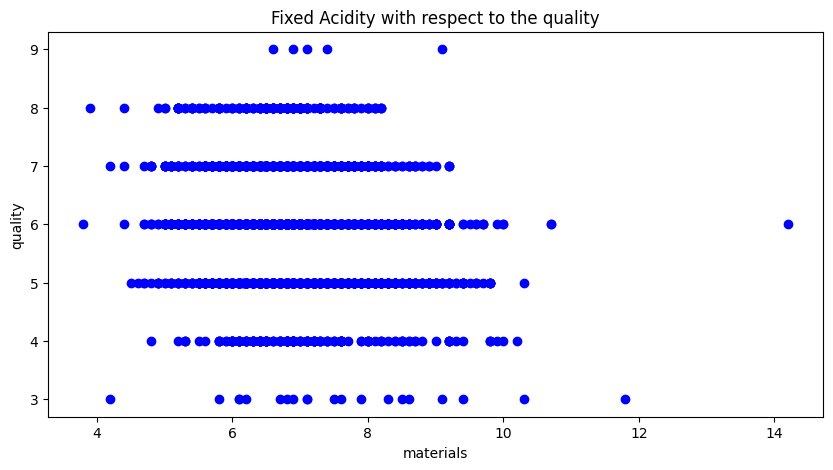

In [30]:

x=df2['fixed acidity']
y=df2['quality']
fig=plt.figure(figsize=(10,5))
plt.scatter(x,y,color="blue")
plt.xlabel("materials")
plt.ylabel("quality")
plt.title("Fixed Acidity with respect to the quality")
plt.show()

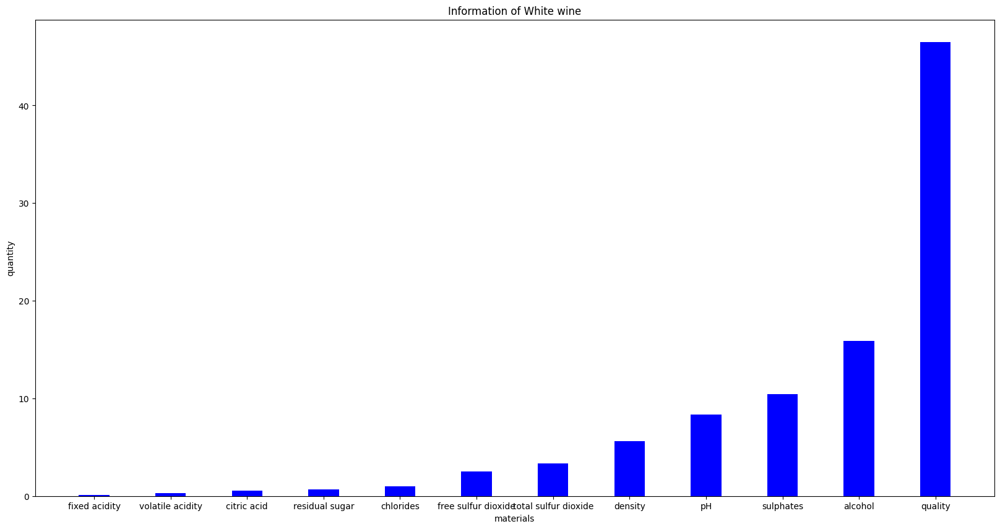

In [31]:

y=list(df2.columns)
x=list(mean)

fig=plt.figure(figsize=(20,10))
plt.bar(y,x,color="blue",width=0.4)
plt.xlabel("materials")
plt.ylabel("quantity")
plt.title("Information of White wine")
plt.show()


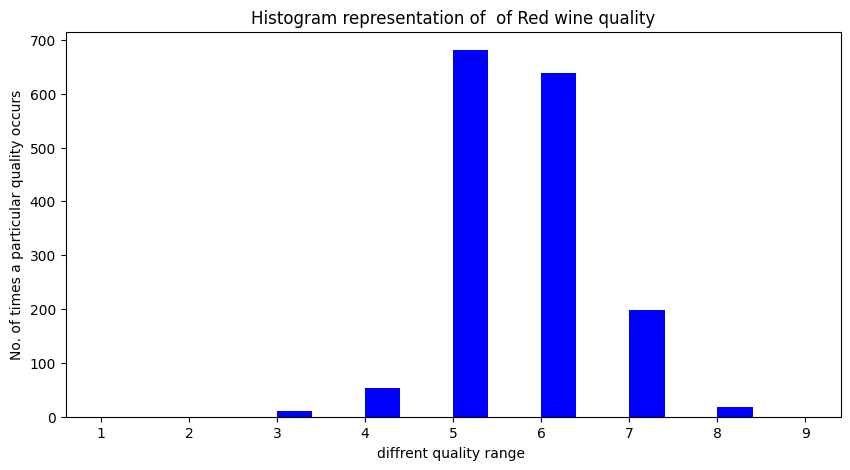

In [32]:

x=list(df1['quality'])
bins=[1,2,3,4,5,6,7,8,9]

fig=plt.figure(figsize=(10,5))
plt.hist(x,bins,color="blue",width=0.4)
plt.xlabel("diffrent quality range ")
plt.ylabel("No. of times a particular quality occurs")
plt.title("Histogram representation of  of Red wine quality")
plt.show()


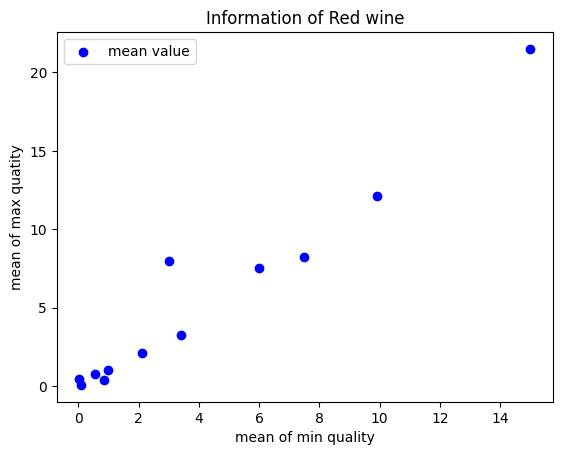

In [33]:
x=d.get_group(3).median()
y=d.get_group(8).median()

# fig=plt.figure(figsize=(10,5))
plt.scatter(x,y,label='mean value',color="blue")
plt.xlabel("mean of min quality")
plt.ylabel("mean of max quatity")
plt.title("Information of Red wine")
plt.legend()
plt.show()


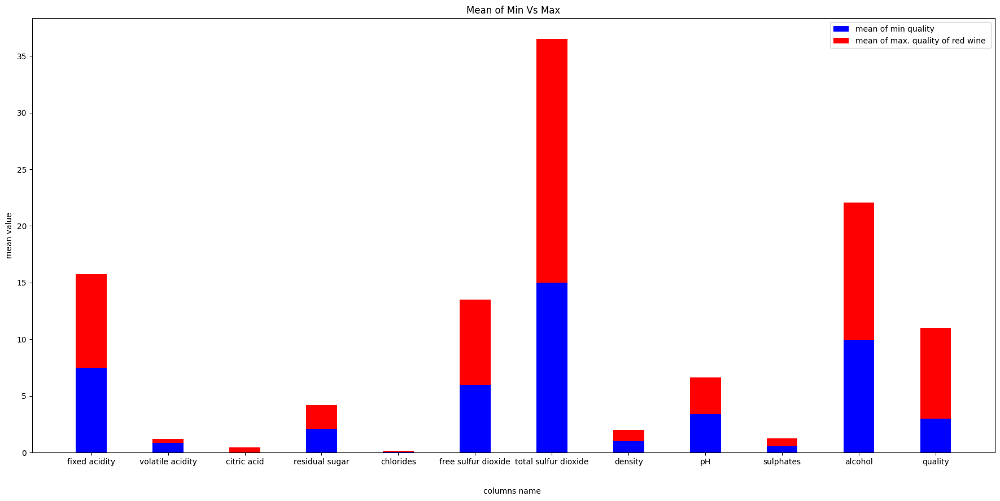

In [34]:

columns=list(df1.columns)
width=0.4
fig=plt.figure(figsize=(22,10))
plt.bar(columns,x,width,color="blue",label="mean of min quality")
plt.bar(columns,y,width,color="red",bottom=x,label="mean of max. quality of red wine ")

plt.xlabel("\n\ncolumns name ")
plt.ylabel("mean value")
plt.title("Mean of Min Vs Max")
plt.legend()
plt.show()


# Conclusion:-
The quality of red wine is increase when the quantity of sulfur is increased,the quality of red wine decreses when the ph is decresesd,that means when so2 is increased the ph is decrese and the overall qaulity is increased.for increase quality of the red wine decrease the volatile acid

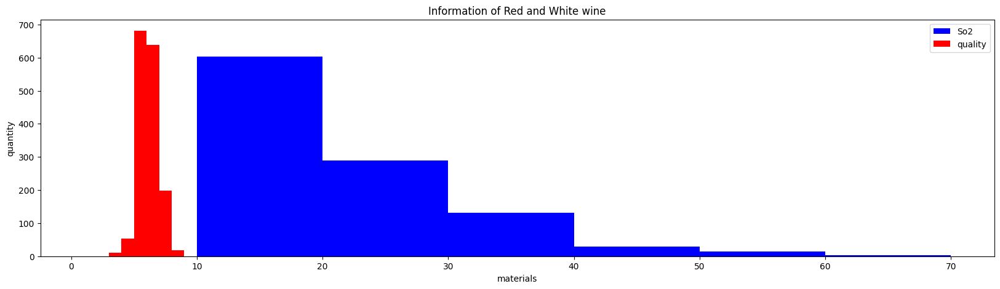

In [35]:

bins1=[10,20,30,40,50,60,70]
bins2=[1,2,3,4,5,6,7,8,9]
width=0.4
x=list(df1['free sulfur dioxide'])
y=list(df1['quality'])
fig=plt.figure(figsize=(20,5))
plt.hist(x,bins1,w,label="So2",color="blue")
plt.hist(y,bins2,w,label="quality",color="red")
plt.xlabel("materials")
plt.ylabel("quantity")
plt.title("Information of Red and White wine")
plt.legend()
plt.show()

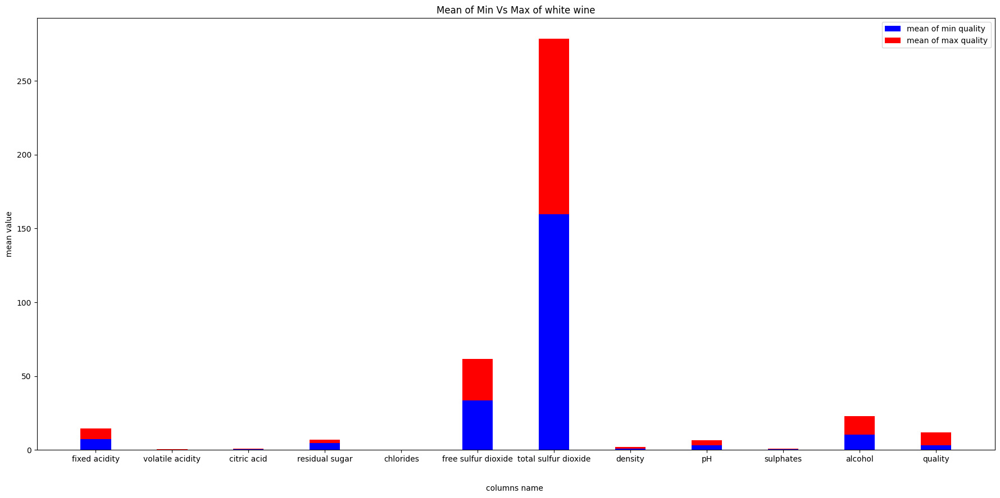

In [36]:

columns=list(df2.columns)
width=0.4
fig=plt.figure(figsize=(22,10))
plt.bar(columns,x1,width,color="blue",label="mean of min quality")
plt.bar(columns,y1,width,color="red",bottom=x1,label="mean of max quality")

plt.xlabel("\n\ncolumns name ")
plt.ylabel("mean value")
plt.title("Mean of Min Vs Max of white wine")
plt.legend()
plt.show()

## Conclusion:-
For white wine if i decrese the value of sulfur dioxide and sugar the quality of white wine will be increased.
In both red and white wine the common element is alcohol that should be increased if you want to increase the quality of the wine.

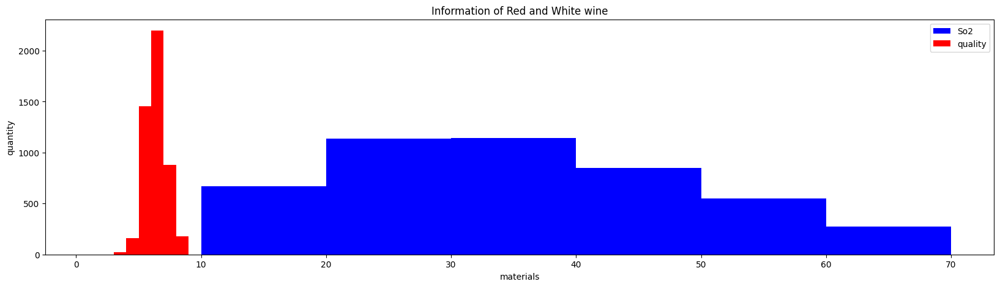

In [37]:

bins1=[10,20,30,40,50,60,70]
bins2=[1,2,3,4,5,6,7,8,9]
width=0.4
x=list(df2['free sulfur dioxide'])
y=list(df2['quality'])
fig=plt.figure(figsize=(20,5))
plt.hist(x,bins1,w,label="So2",color="blue")
plt.hist(y,bins2,w,label="quality",color="red")
plt.xlabel("materials")
plt.ylabel("quantity")
plt.title("Information of Red and White wine")
plt.legend()
plt.show()

## EDA with AutoEDA

                                             |          | [  0%]   00:00 -> (? left)

Report wine_quality_sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



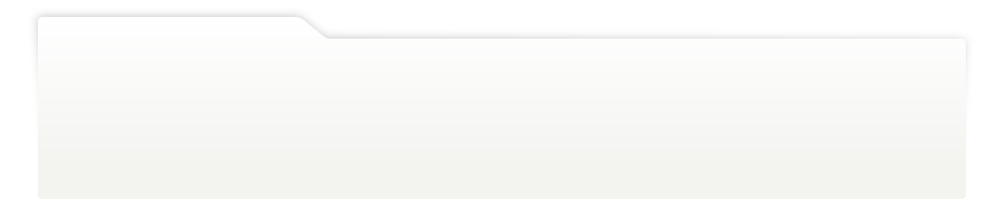
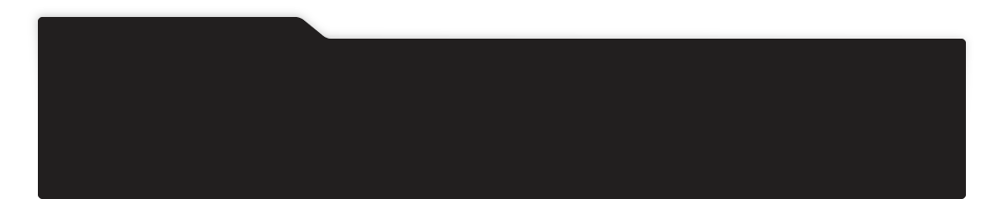
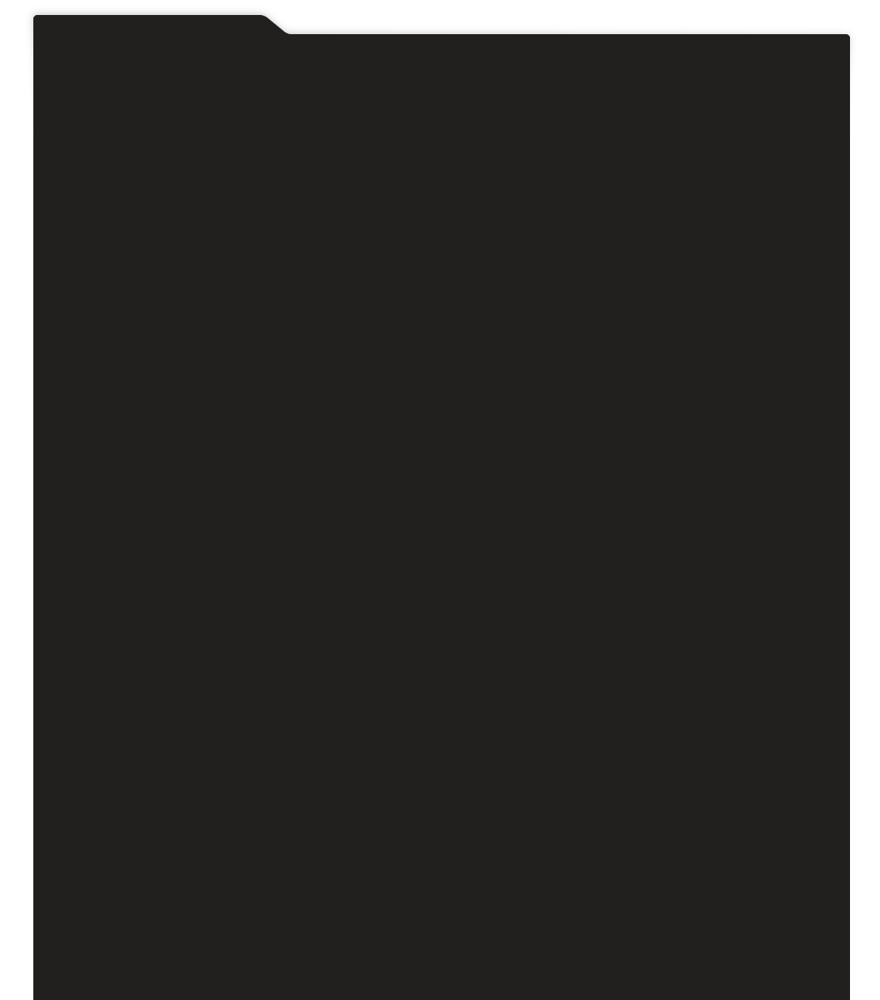
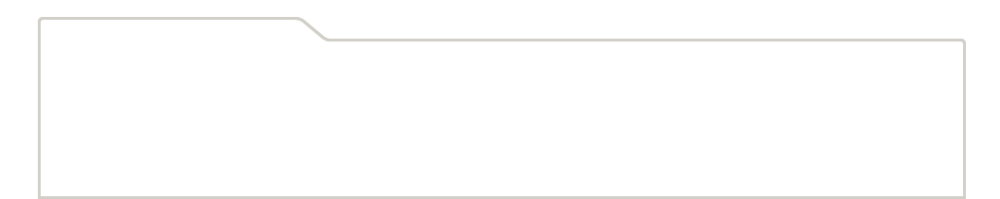
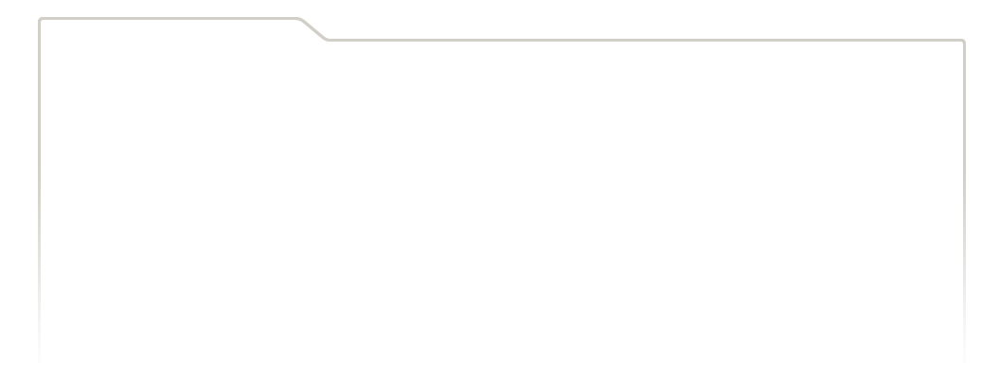
...
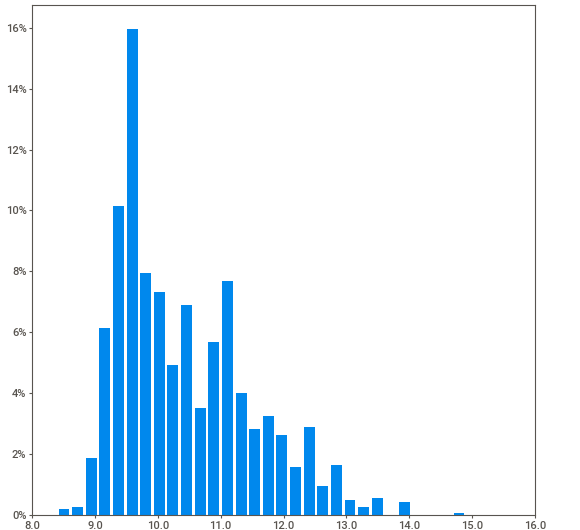
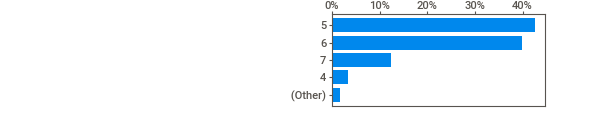
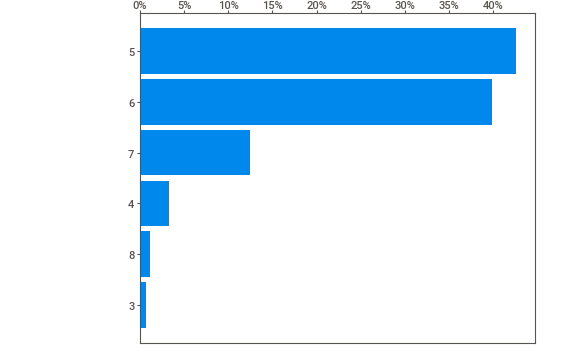
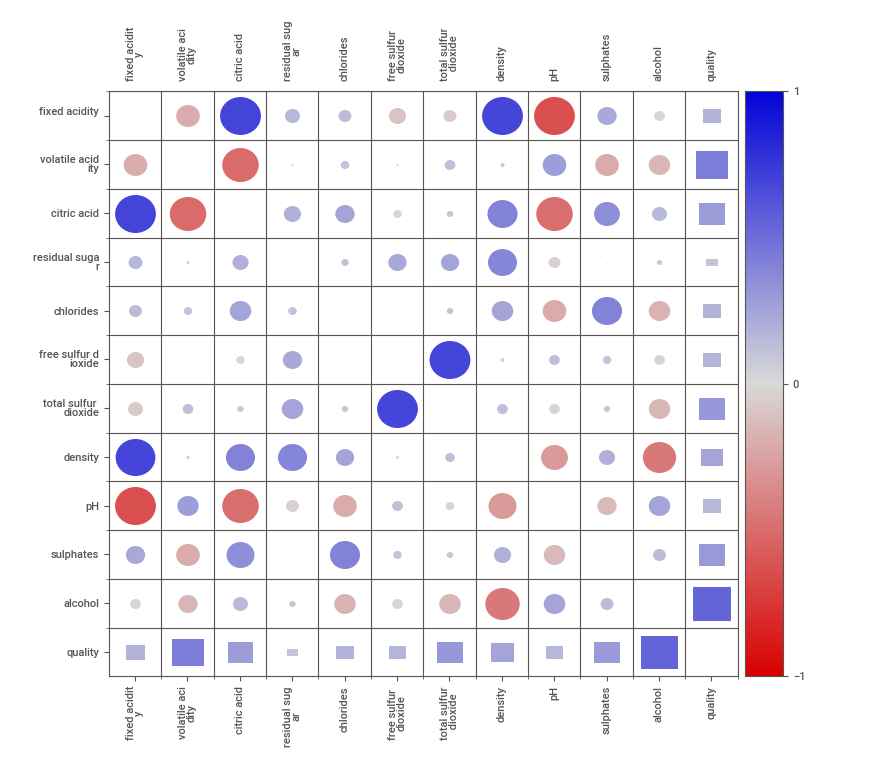
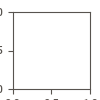

In [42]:
# -------------------
# AutoEDA using Sweetviz
# -------------------


# Generate Sweetviz report
report = sv.analyze(df1)

# Save the report as HTML
report.show_html('wine_quality_sweetviz_report.html')  # Save report

# To display it inline in the notebook
report.show_notebook()



##Feature Engineering With Randomforst Regression Model

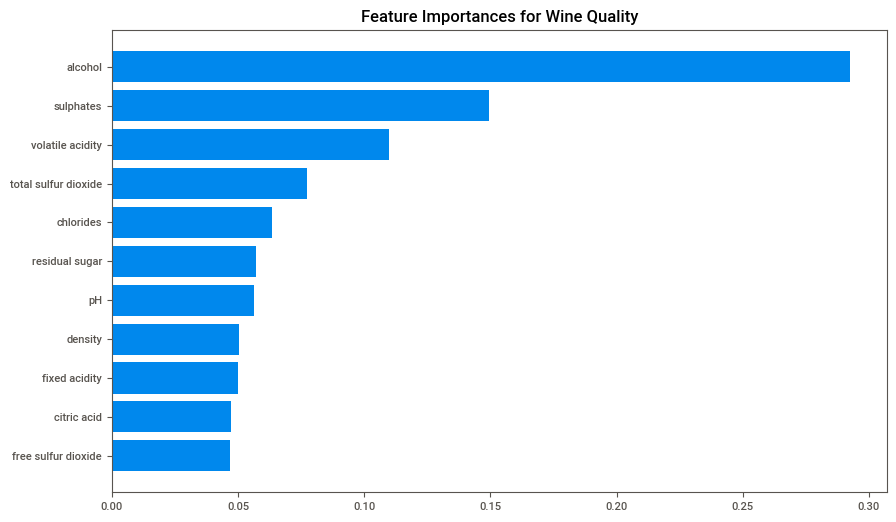

Mean Squared Error: 0.34826229166666667


In [43]:

# Separate features and target
X = df1.drop('quality', axis=1)
y = df1['quality']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Get feature importances
importances = rf.feature_importances_
feature_names = X.columns

# Sort feature importances
sorted_indices = importances.argsort()

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_indices)), importances[sorted_indices], align='center')
plt.yticks(range(len(sorted_indices)), feature_names[sorted_indices])
plt.title('Feature Importances for Wine Quality')
plt.show()

# Evaluate the model (Optional)
y_pred = rf.predict(X_test)
print("Mean Squared Error:", mean_squared_error(y_test, y_pred))


### **We can see from the above model also we are getting the importnat feature as common alchohol,volatile acidity,sulfur dioxide,sugar etc..**

##Model Preparation and Selection

##Task2.Model Selection, Training, and Hyperparameter Tuning

Task: Train multiple models, tune hyperparameters, and select the best-
performing model.
Details: Utilize tools like AutoML, KizenML, or others for model selection
and hyperparameter tuning. Document the experimentation process and
justify your model choice


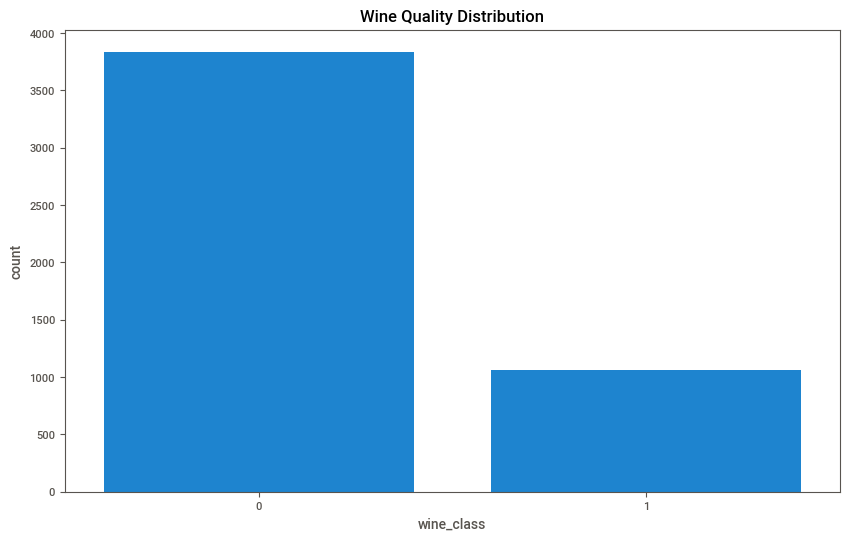

In [44]:
# Wine Quality Classification using TPOT for AutoML
# Jupyter Notebook format


# -------------------
# Data Collection and Preprocessing
# -------------------

# Load dataset
df1 = pd.read_csv('winequality-white.csv',sep=";")  # Replace with your dataset

# Data Cleaning
df1.dropna(inplace=True)  # Removing missing data

# Feature Engineering
df1['wine_class'] = df1['quality'].apply(lambda x: 1 if x >= 7 else (0 ))

# Visualize data distribution using Seaborn
plt.figure(figsize=(10, 6))
sns.countplot(x='wine_class', data=df1)
plt.title('Wine Quality Distribution')
plt.show()

# Data Preprocessing
features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
           'total sulfur dioxide',
             'pH',  'alcohol']
X = df1[features]
y = df1['wine_class']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Scaling / Normalization
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


## Model Selection and Hyperparameter Tuning with TPOT

In [45]:
# -------------------
# Model Selection and Hyperparameter Tuning with TPOT
# -------------------


# Use TPOT for AutoML model selection and hyperparameter tuning
tpot = TPOTClassifier(verbosity=2, generations=5, population_size=20, random_state=42)

# Fit the TPOT model on training data
tpot.fit(X_train_scaled, y_train)

# Evaluate on test data
y_pred = tpot.predict(X_test_scaled)

# Performance evaluation


print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(f"Classification Report:\n{classification_report(y_test, y_pred)}")

# -------------------
# Save the Preprocessed Data and Model
# -------------------


# Save preprocessed data and best model
processed_data = {
    'X_train': X_train_scaled,
    'X_test': X_test_scaled,
    'y_train': y_train,
    'y_test': y_test
}

# Save the best model and preprocessed data to pickle files
with open('processed_data.pkl', 'wb') as f:
    pickle.dump(processed_data, f)

tpot.export('best_model_tpot.pkl')  # Save the best model pipeline as Python code


Optimization Progress:   0%|          | 0/120 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.8369249430742057

Generation 2 - Current best internal CV score: 0.8369249430742057

Generation 3 - Current best internal CV score: 0.8480138749973399

Generation 4 - Current best internal CV score: 0.8480138749973399

Generation 5 - Current best internal CV score: 0.8553071864825179

Best pipeline: KNeighborsClassifier(ZeroCount(input_matrix), n_neighbors=97, p=1, weights=distance)
Accuracy: 0.8687074829931973
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.97      0.92      1141
           1       0.83      0.52      0.64       329

    accuracy                           0.87      1470
   macro avg       0.85      0.74      0.78      1470
weighted avg       0.87      0.87      0.86      1470

